<a href="https://colab.research.google.com/github/yo-carthy/sugarcaneimageprocessing/blob/master/sugarcane_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Download libraries

In [0]:
from skimage.color import rgb2gray
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import ndimage
from google.colab.patches import cv2_imshow

#### Import drive

In [0]:
from google.colab import drive
drive.mount("/content/drive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


#### Read image and plot it

/datalab


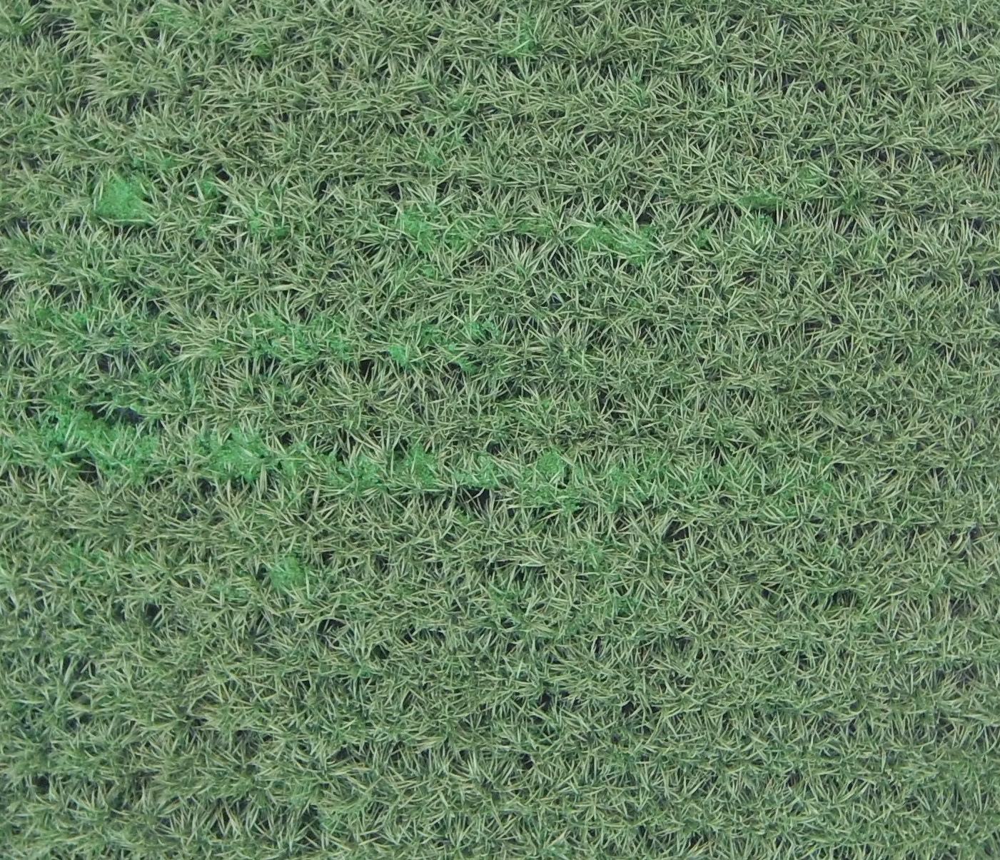

In [0]:
%cd /datalab
im1 = plt.imread('dji_0004.jpg')
im1.shape
cv2_imshow(im1)


#### Change image to Grayscale

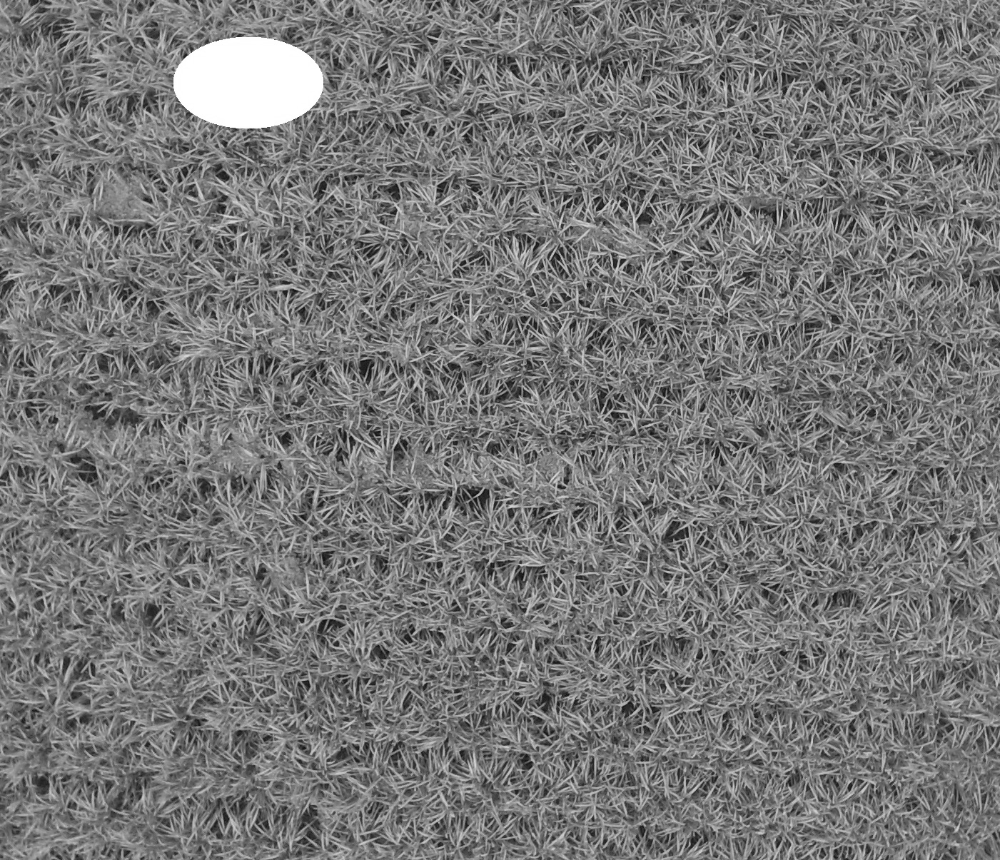

In [0]:
gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

#### Resize image

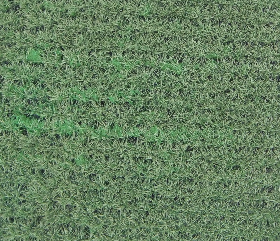

In [0]:
width=280
height=241
im2 = cv2.resize(im1 , (width,height))
cv2_imshow(im2)

#### Change image to hsv

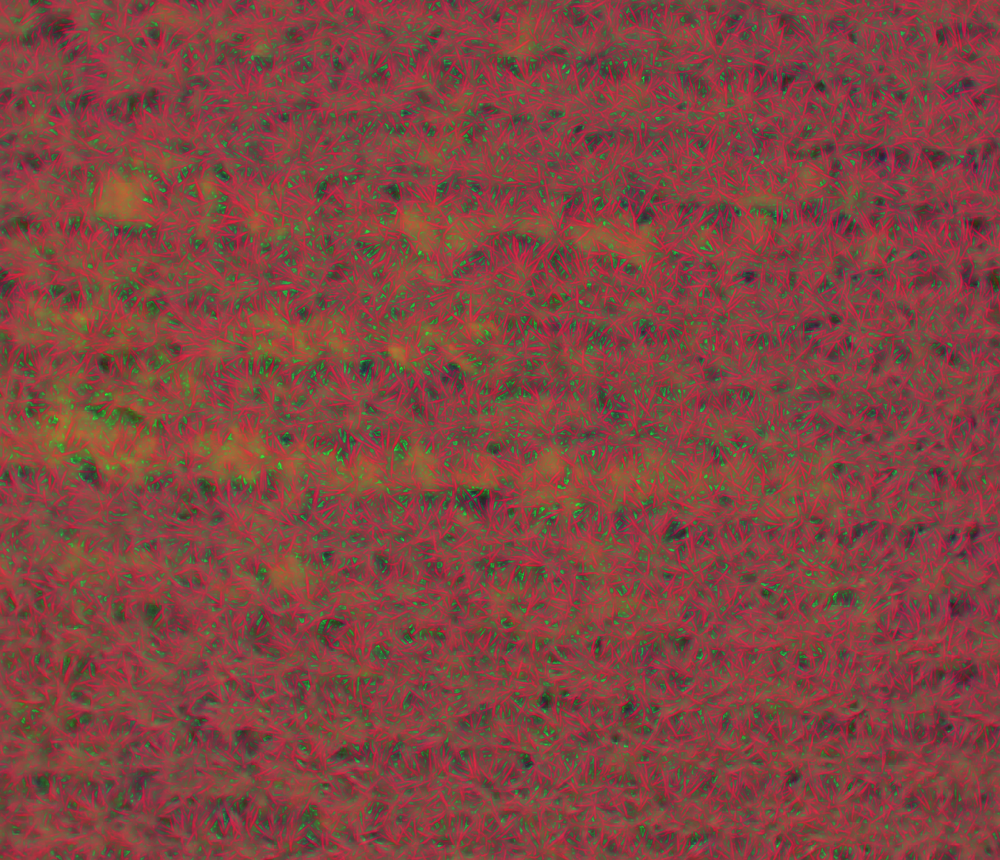

In [0]:
hsv1 = cv2.cvtColor(im1, cv2.COLOR_RGB2HSV)
h,s,v = cv2.split(hsv1)
cv2_imshow(hsv1)


#### Divide image into h,s,v

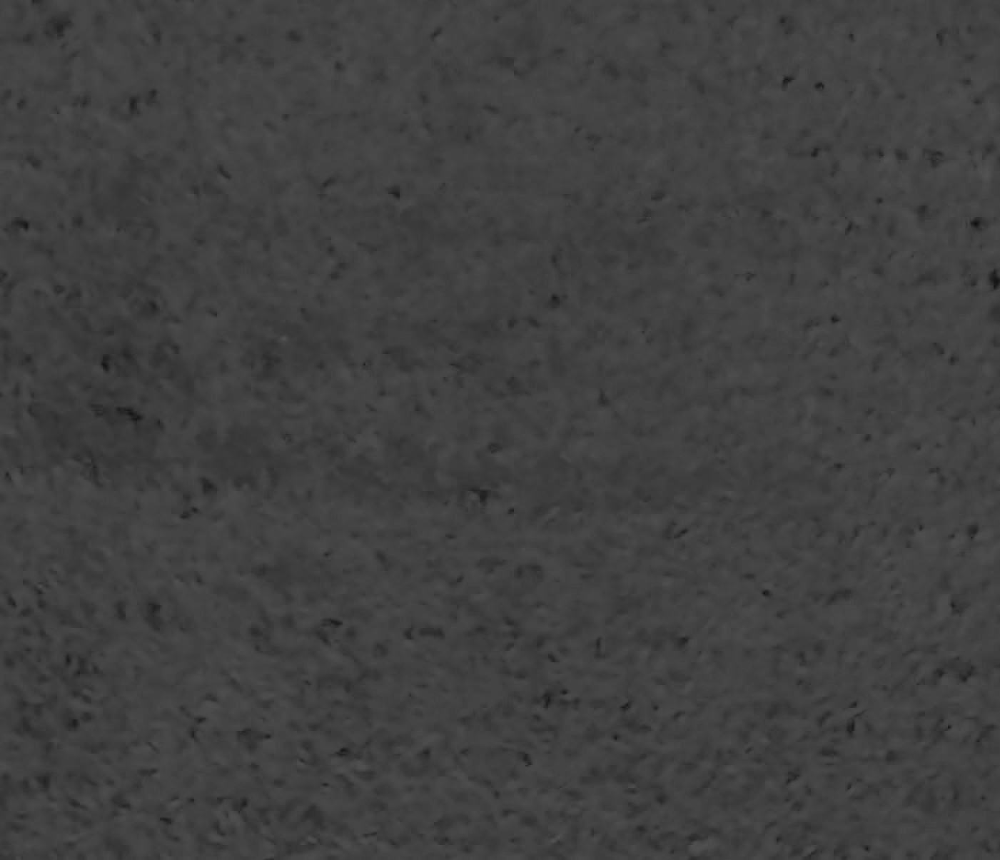

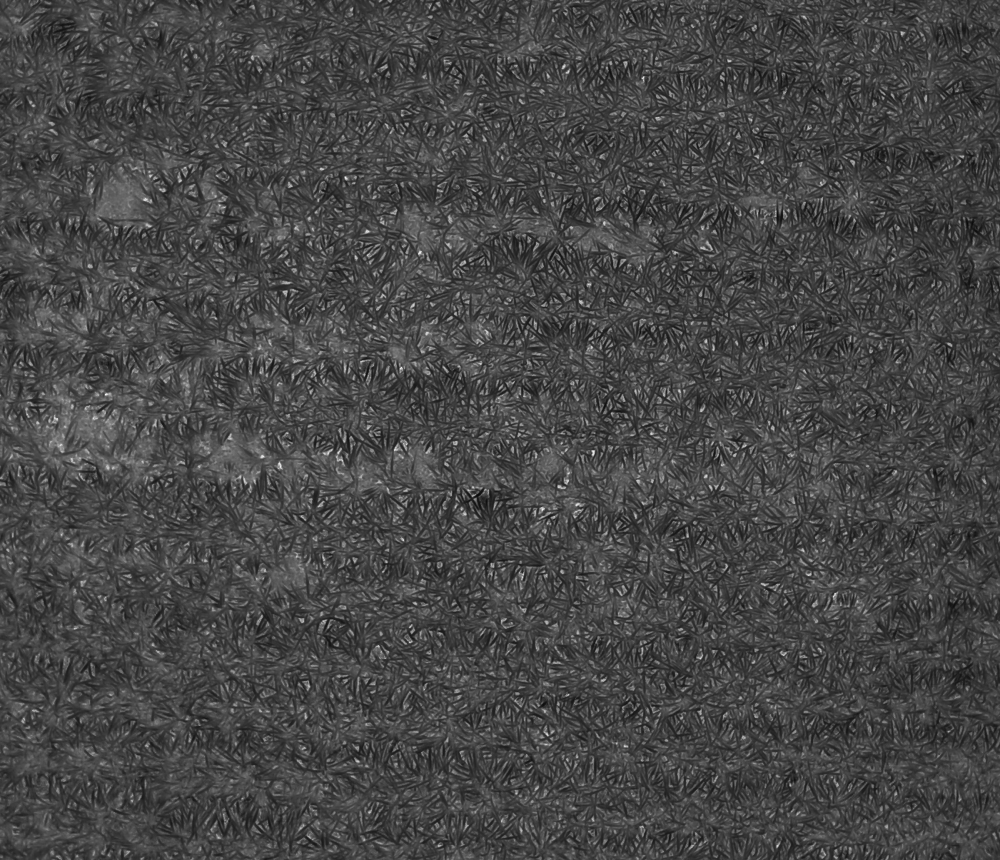

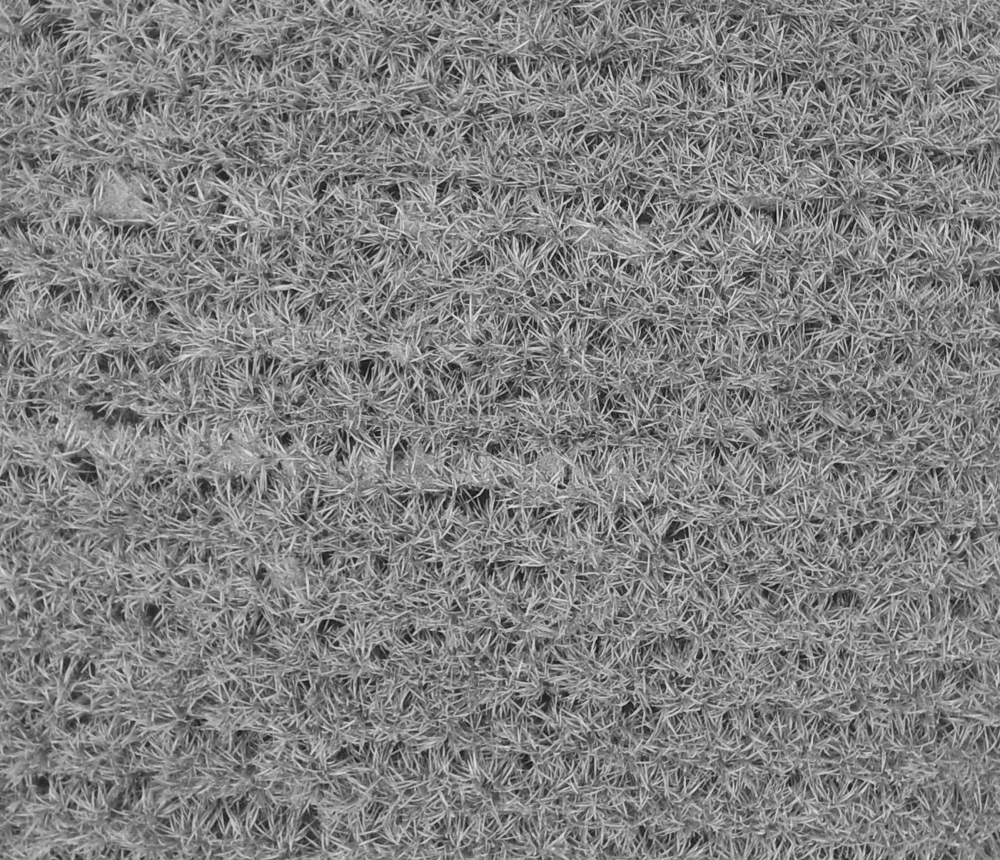

In [0]:
h,s,v = cv2.split(hsv1)
cv2_imshow(h)
cv2_imshow(s)
cv2_imshow(v)


In [0]:
light_yellow = (0, 0, 54)
dark_yellow = (0, 0, 39)
mask = cv2.inRange(s, light_yellow, dark_yellow)
result = cv2.bitwise_and(im2, im2, mask=mask)
plt.imshow(mask, cmap="gray")

error: ignored

#### Check shape of image

In [0]:
s.shape

(241, 280)

#### Divide image into background and foreground - Global threshold

69.75245998814464


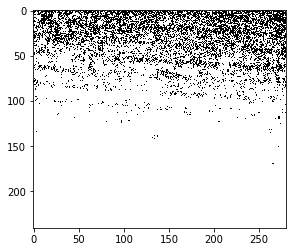

In [0]:

gray_r = gray.reshape(gray.shape[0]*gray.shape[1])
print(gray_r.mean())
for i in range(gray_r.shape[0]):
    if gray_r[i] > gray_r.mean():
        gray_r[i] = 1
    else:
        gray_r[i] = 0
gray_global = gray_r.reshape(gray.shape[0],gray.shape[1])
plt.imshow(gray_global, cmap='gray')

#### Multiple thresholds

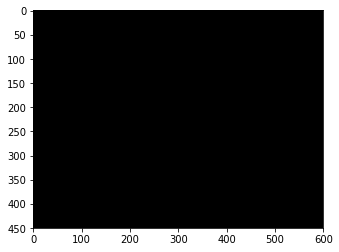

In [0]:
gray_r = gray.reshape(gray.shape[0]*gray.shape[1])
for i in range(gray_r.shape[0]):
    if gray_r[i] > 0.1:
        gray_r[i] = 1
    else:
        gray_r[i] = 0
gray = gray_r.reshape(gray.shape[0],gray.shape[1])
plt.imshow(gray, cmap='gray')